# Уроки по Python3
## Нейронные сети


### Датасет MNIST

База данных MNIST (сокращение от «Modified National Institute of Standards and Technology») – объёмная база данных образцов рукописного написания цифр. База данных является стандартом, предложенным Национальным институтом стандартов и технологий США с целью калибрации и сопоставления методов распознавания изображений с помощью машинного обучения в первую очередь на основе нейронных сетей. Данные состоят из заранее подготовленных примеров изображений, на основе которых проводится обучение и тестирование систем. База данных была создана после переработки оригинального набора чёрно-белых образцов размером 20x20 пикселей NIST. Создатели базы данных NIST, в свою очередь, использовали набор образцов из Бюро переписи населения США, к которому были добавлены ещё тестовые образцы, написанные студентами американских университетов. Образцы из набора NIST были нормализированы, прошли сглаживание и приведены к серому полутоновому изображению размером 28x28 пикселей.

База данных MNIST содержит 60000 изображений для обучения и 10000 изображений для тестирования. Половина образцов для обучения и тестирования были взяты из набора NIST для обучения, а другая половина – из набора NIST для тестирования. 

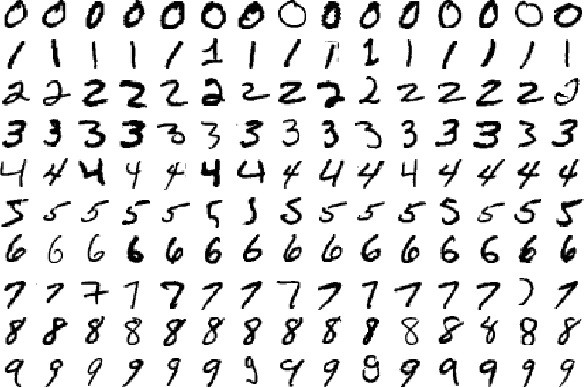

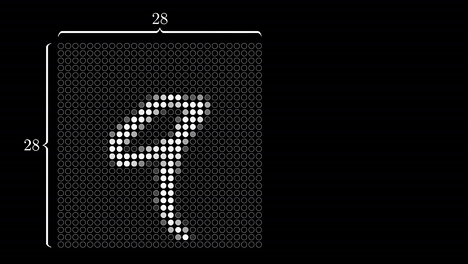

In [1]:
from sklearn.model_selection import train_test_split
from sklearn import datasets
from sklearn import metrics
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import pandas as pd
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers.core import Dense, Activation, Dropout, Flatten
from keras.layers.convolutional import Conv2D
from keras.layers.convolutional import MaxPooling2D

Using TensorFlow backend.


Загружаем датасет MNIST и выводим описание и особенности

In [3]:
mnist = datasets.fetch_mldata('MNIST Original')
print('Разделы в датасете: ', mnist.keys())
print('Размер данных: ', mnist.data.shape)
print('Название колонок: ', mnist['COL_NAMES'])
print('Колонка с целями: ', mnist['target'])
print('Число примеров: ', mnist['target'].shape[0])
print('Описание: ', mnist.DESCR)

Разделы в датасете:  dict_keys(['target', 'DESCR', 'data', 'COL_NAMES'])
Размер данных:  (70000, 784)
Название колонок:  ['label', 'data']
Колонка с целями:  [0. 0. 0. ... 9. 9. 9.]
Число примеров:  70000
Описание:  mldata.org dataset: mnist-original


Входные данные должны быть размером:

In [4]:
img_rows, img_cols = 28, 28

In [5]:
data = mnist.data.reshape((mnist.data.shape[0], img_rows, img_cols))
data = data[:, :, :, np.newaxis]

С помощью **train_test_split** разделяем датасет на тренировочную и валидационную части и нормализуем изображения:

In [6]:
train_size = 0.1
test_size = 0.01

X_train, X_test, Y_train, Y_test = train_test_split(data / 255.0,
                                                    mnist.target.astype('int0'),
                                                    train_size=train_size,
                                                    test_size=test_size,
                                                    random_state=42)

In [7]:
X_train.shape, X_test.shape

((7000, 28, 28, 1), (700, 28, 28, 1))

Конвертируем классовые метки в бинарный вектор (one hot encoding):

In [8]:
i = 0

print('Классовые метки выглядят просто как целые числе: ', Y_train[i])

Классовые метки выглядят просто как целые числе:  4


In [9]:
number_of_classes = 10

Y_train = np_utils.to_categorical(Y_train, number_of_classes)
Y_test = np_utils.to_categorical(Y_test, number_of_classes)

Теперь классовый вектор выглядит так:  [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]


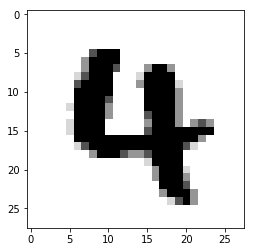

In [10]:
plt.imshow(X_train[i].reshape(img_rows, img_cols)*255, cmap='Greys')
print('Теперь классовый вектор выглядит так: ', Y_train[i])
plt.show();

--------

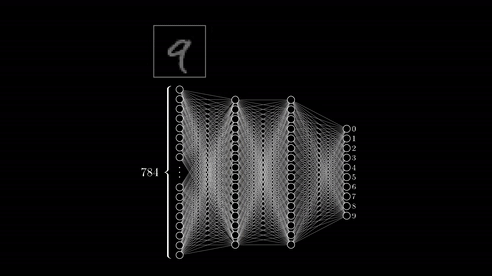

**Создание конволюционной нейронной сети**

In [11]:
model = Sequential() # Создаём последовательную модель в keras

# 20 входных параметров (окно 5х5) и 50 нейронов в скрытом слое со смещением 2,2
model.add(Conv2D(20, (5, 5), activation='relu', input_shape=(28, 28, 1)))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Conv2D(50, (5, 5), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Flatten())
model.add(Dense(500, activation='relu'))
model.add(Dense(10, activation='softmax')) # 10 нейронов на выходе по количеству классов

Компиляция модели

In [12]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

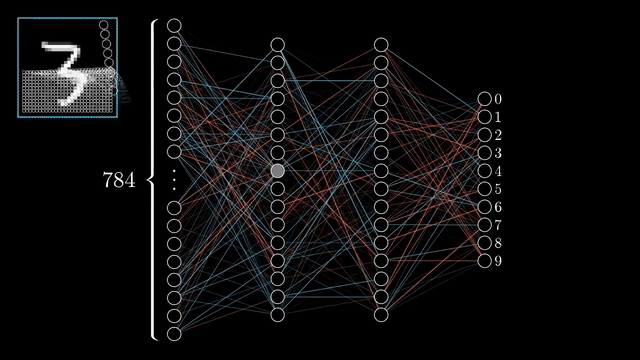

Настройки и запуск расчета на тренировочной выборке

In [13]:
batch_size = 64 # количество примеров за раз
epochs = 10 # количество проходов по всему датасету

print('Запуск расчёта модели...')
history = model.fit(X_train, Y_train, verbose=epochs, batch_size=batch_size, epochs=epochs)

Запуск расчёта модели...
Epoch 1/10
Epoch 2/10
Epoch 3/10
Epoch 4/10
Epoch 5/10
Epoch 6/10
Epoch 7/10
Epoch 8/10
Epoch 9/10
Epoch 10/10


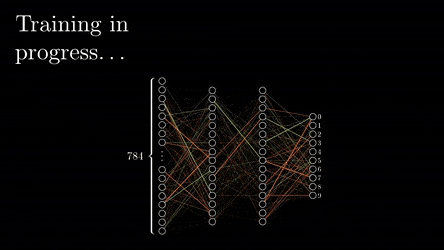

Оценка полученных результатов на валидационной выборке

In [14]:
loss, accuracy = model.evaluate(X_test, Y_test, verbose=0)

print('Потери на валидационной выборке = {:.2f}'.format(loss))
print('Точность на валидационной выборке = {:.2f}'.format(accuracy))

Потери на валидационной выборке = 0.08
Точность на валидационной выборке = 0.97


Визуализация процесса обучения

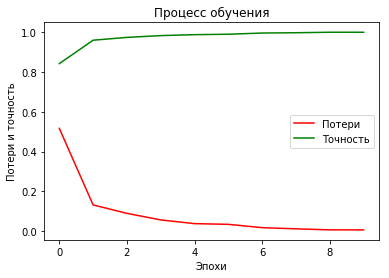

In [15]:
plt.plot(history.history['loss'], color='red')
plt.plot(history.history['acc'], color='green')
plt.title('Процесс обучения')
plt.xlabel('Эпохи')
plt.ylabel('Потери и точность')
plt.legend(['Потери', 'Точность'], loc='center right')
plt.show()

Предсказываем значения на валидационной выборке

In [16]:
Z_test = model.predict(X_test)

Z_test = np.argmax(Z_test, axis=1)
Y_test = np.argmax(Y_test, axis=1)

Выводим матрицу классфикации и отчет о точности полученной модели:

In [17]:
print('Матрица классификации: ', '\n', metrics.confusion_matrix(Y_test, Z_test), '\n')
print('Отчет о классификации: ', '\n', metrics.classification_report(Y_test, Z_test))

Матрица классификации:  
 [[49  0  1  0  0  0  0  0  0  0]
 [ 0 73  0  0  0  0  1  1  0  0]
 [ 0  1 70  0  0  0  0  0  0  0]
 [ 0  0  1 67  0  0  0  0  1  0]
 [ 0  0  0  0 59  0  0  0  0  1]
 [ 0  0  0  1  0 78  0  0  0  1]
 [ 0  0  0  0  0  1 77  0  1  0]
 [ 0  0  1  0  0  0  0 80  0  0]
 [ 0  0  1  0  0  1  0  0 75  3]
 [ 1  0  0  0  0  0  0  0  1 53]] 

Отчет о классификации:  
              precision    recall  f1-score   support

          0       0.98      0.98      0.98        50
          1       0.99      0.97      0.98        75
          2       0.95      0.99      0.97        71
          3       0.99      0.97      0.98        69
          4       1.00      0.98      0.99        60
          5       0.97      0.97      0.97        80
          6       0.99      0.97      0.98        79
          7       0.99      0.99      0.99        81
          8       0.96      0.94      0.95        80
          9       0.91      0.96      0.94        55

avg / total       0.97      0.

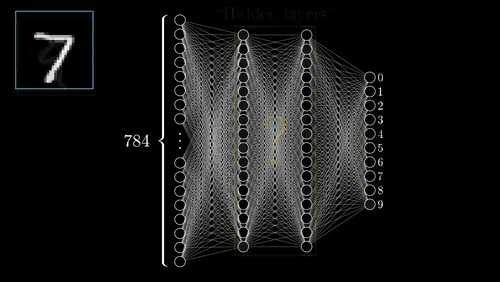

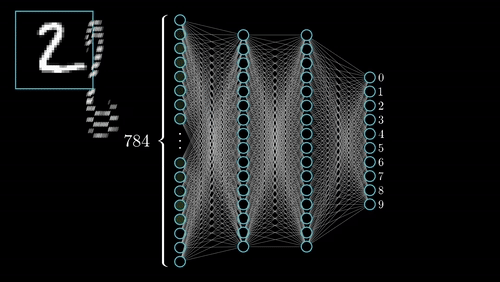

Выводим полученные примеры

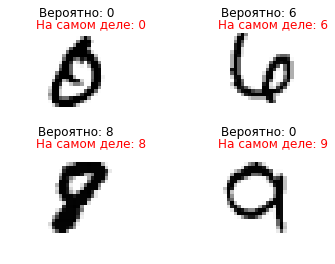

In [18]:
sample1 = 14
sample2 = 23
sample3 = 25
sample4 = 29

cmap = 'Greys'

plt.figure(1)
plt.subplot(221)
plt.imshow(X_test[sample1].reshape(28, 28), cmap=cmap)
plt.axis('off')
plt.title('Вероятно: %d' % Z_test[sample1])
plt.text(2, 1, 'На самом деле: %d' % Y_test[sample1], fontdict={'color': 'red', 'size': 12})
plt.subplot(222)
plt.imshow(X_test[sample2].reshape(28, 28), cmap=cmap)
plt.axis('off')
plt.title('Вероятно: %s' % Z_test[sample2])
plt.text(2, 1, 'На самом деле: %d' % Y_test[sample2], fontdict={'color': 'red', 'size': 12})
plt.subplot(223)
plt.imshow(X_test[sample3].reshape(28, 28), cmap=cmap)
plt.axis('off')
plt.title('Вероятно: %s' % Z_test[sample3])
plt.text(2, 1, 'На самом деле: %d' % Y_test[sample3], fontdict={'color': 'red', 'size': 12})
plt.subplot(224)
plt.imshow(X_test[sample4].reshape(28, 28), cmap=cmap)
plt.axis('off')
plt.title('Вероятно: %s' % Z_test[sample4])
plt.text(2, 1, 'На самом деле: %d' % Y_test[sample4], fontdict={'color': 'red', 'size': 12})
plt.show()